# Master's personal project

In [1]:
# Importing all the needed packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.metrics import make_scorer, mean_absolute_percentage_error, mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_validate, cross_val_score
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import TimeSeriesSplit
mape_score = make_scorer(mean_absolute_percentage_error, greater_is_better = False)
from plottings import learning_curve
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import plottings
from plottings import plot_learning_curve
from sklearn.ensemble import GradientBoostingRegressor

%matplotlib inline
%config InlineBackend.figure_format = "retina"
plt.rcParams['figure.figsize'] = (25.0, 15.0)
sns.set()

# EDA of the dataset

###### First thing first we are going to import the dataset and we will transform it in a dataframe. After that we will begin with the exploratory data analysis through pandas and the plots form matplotlib and seaborn

In [2]:
df = pd.read_csv('train.csv', parse_dates=['dteday'])
df

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,16633,2012-11-30,4,1,11,19,0,5,1,1,0.32,0.3485,0.66,0.0000,18,359,377
16633,16634,2012-11-30,4,1,11,20,0,5,1,1,0.32,0.3485,0.66,0.0000,12,233,245
16634,16635,2012-11-30,4,1,11,21,0,5,1,1,0.30,0.3182,0.75,0.0896,14,169,183
16635,16636,2012-11-30,4,1,11,22,0,5,1,1,0.30,0.3333,0.75,0.0000,18,145,163


In [3]:
# creating a new dataset dropping thwo labels we are not going to use

bikes = df.drop(['casual','registered'], axis=1)
bikes.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,1


In [4]:
bikes.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
count,16637.00000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000
mean,8319.00000,2.482058,0.480375,6.294164,11.547875,0.028671,3.006552,0.684378,1.415580,0.504745,0.482608,0.624756,0.190310,190.477009
std,4802.83255,1.085930,0.499630,3.310969,6.914199,0.166885,2.002377,0.464777,0.637298,0.192369,0.171557,0.193227,0.121915,182.026755
min,1.00000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,1.000000
25%,4160.00000,2.000000,0.000000,3.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.470000,0.104500,41.000000
50%,8319.00000,2.000000,0.000000,6.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.520000,0.500000,0.620000,0.194000,143.000000
75%,12478.00000,3.000000,1.000000,9.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,282.000000
max,16637.00000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,977.000000


In [5]:
bikes.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16637 entries, 0 to 16636
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     16637 non-null  int64         
 1   dteday      16637 non-null  datetime64[ns]
 2   season      16637 non-null  int64         
 3   yr          16637 non-null  int64         
 4   mnth        16637 non-null  int64         
 5   hr          16637 non-null  int64         
 6   holiday     16637 non-null  int64         
 7   weekday     16637 non-null  int64         
 8   workingday  16637 non-null  int64         
 9   weathersit  16637 non-null  int64         
 10  temp        16637 non-null  float64       
 11  atemp       16637 non-null  float64       
 12  hum         16637 non-null  float64       
 13  windspeed   16637 non-null  float64       
 14  cnt         16637 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(10)
memory usage: 1.9 MB


In [6]:
#checking out if there are some duplicates

duplicates_count = len(bikes) - len(bikes.drop_duplicates())
duplicates_count

0

In [7]:
#checking the null values

bikes.isnull().sum().sort_values(ascending=False)/len(bikes)

instant       0.0
dteday        0.0
season        0.0
yr            0.0
mnth          0.0
hr            0.0
holiday       0.0
weekday       0.0
workingday    0.0
weathersit    0.0
temp          0.0
atemp         0.0
hum           0.0
windspeed     0.0
cnt           0.0
dtype: float64

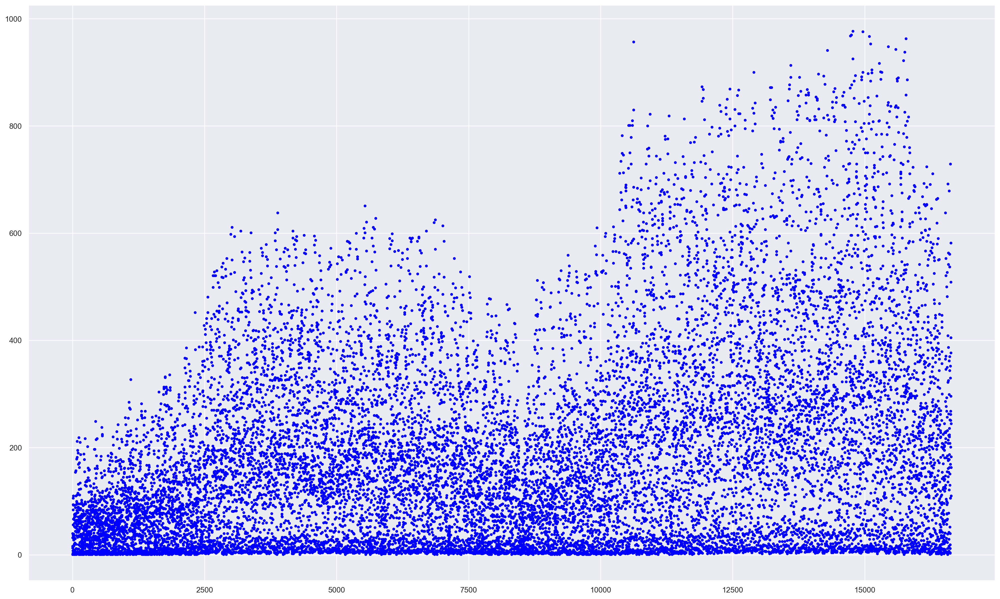

In [8]:
#checking out the distribution of the data 

bikes.cnt.plot(style=('.'), color='blue')
plt.show()

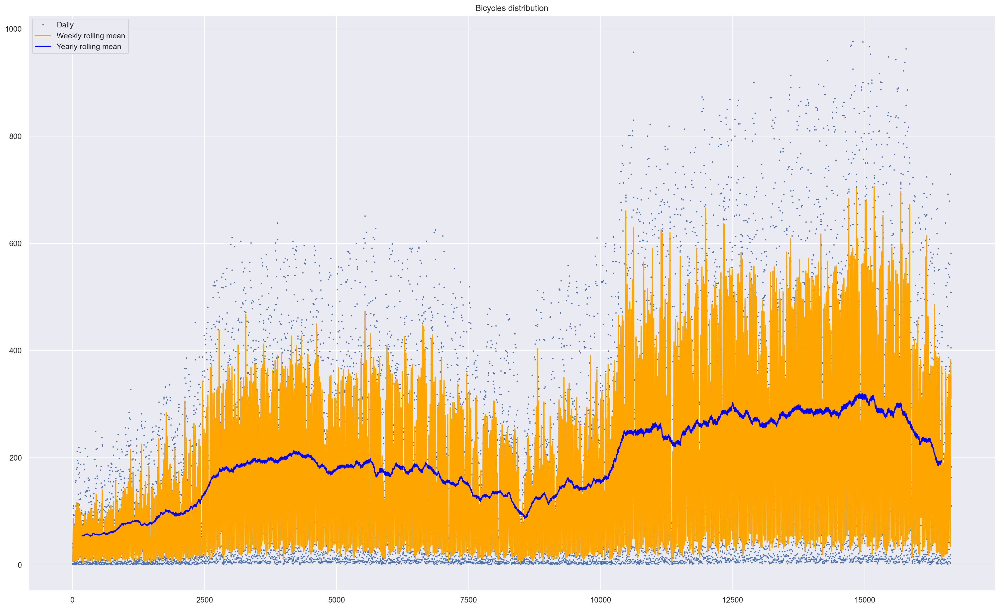

In [9]:
#a plot to see the seasonality and the trend of the data

plt.plot(bikes['cnt'],
         marker='.',
         markersize=2,
         linestyle='',
         label='Daily')

plt.plot(bikes['cnt'].rolling(7, center=True).mean(),
         label='Weekly rolling mean',
         color='orange')

plt.plot(bikes['cnt'].rolling(365, center=True).mean(),
         label='Yearly rolling mean',
         color='blue')

plt.title('Bicycles distribution')
plt.legend();

C:\Users\alexp\AppData\Local\Temp\ipykernel_16480\3441183311.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = bikes.corr()


<AxesSubplot:>

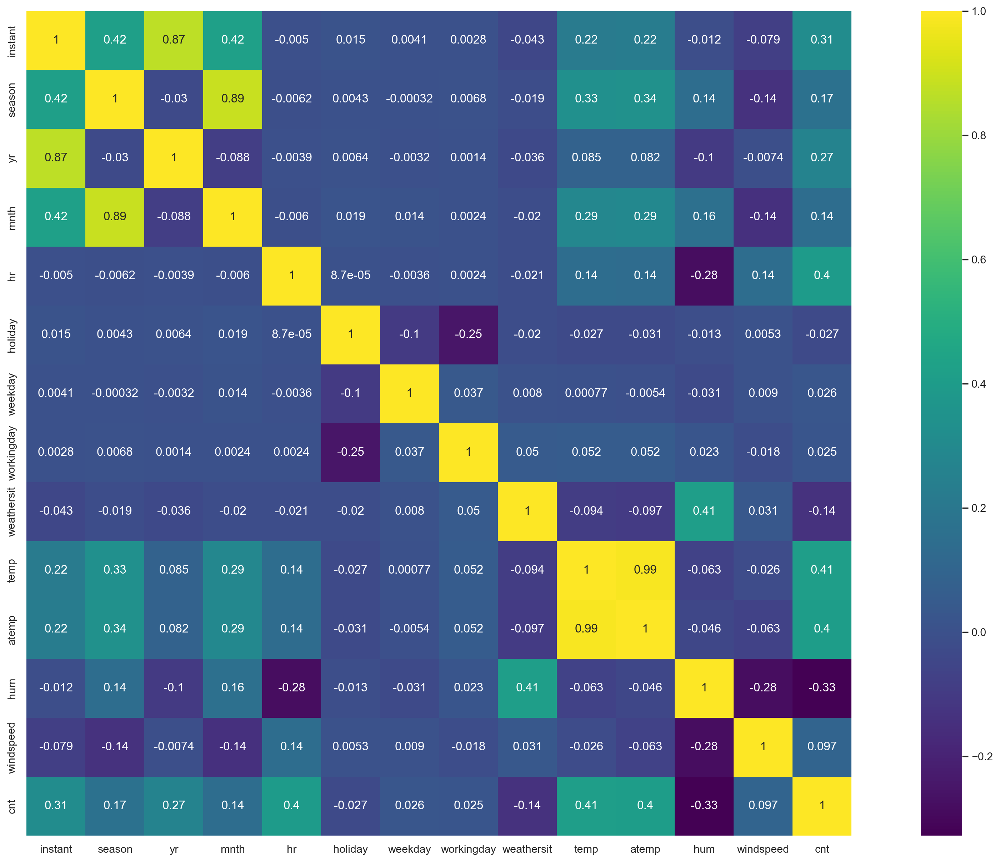

In [10]:
#creating a heatmap to check the correlation between the features and the label

corr_matrix = bikes.corr()
sns.heatmap(corr_matrix, annot=True, cmap='viridis', square=True)

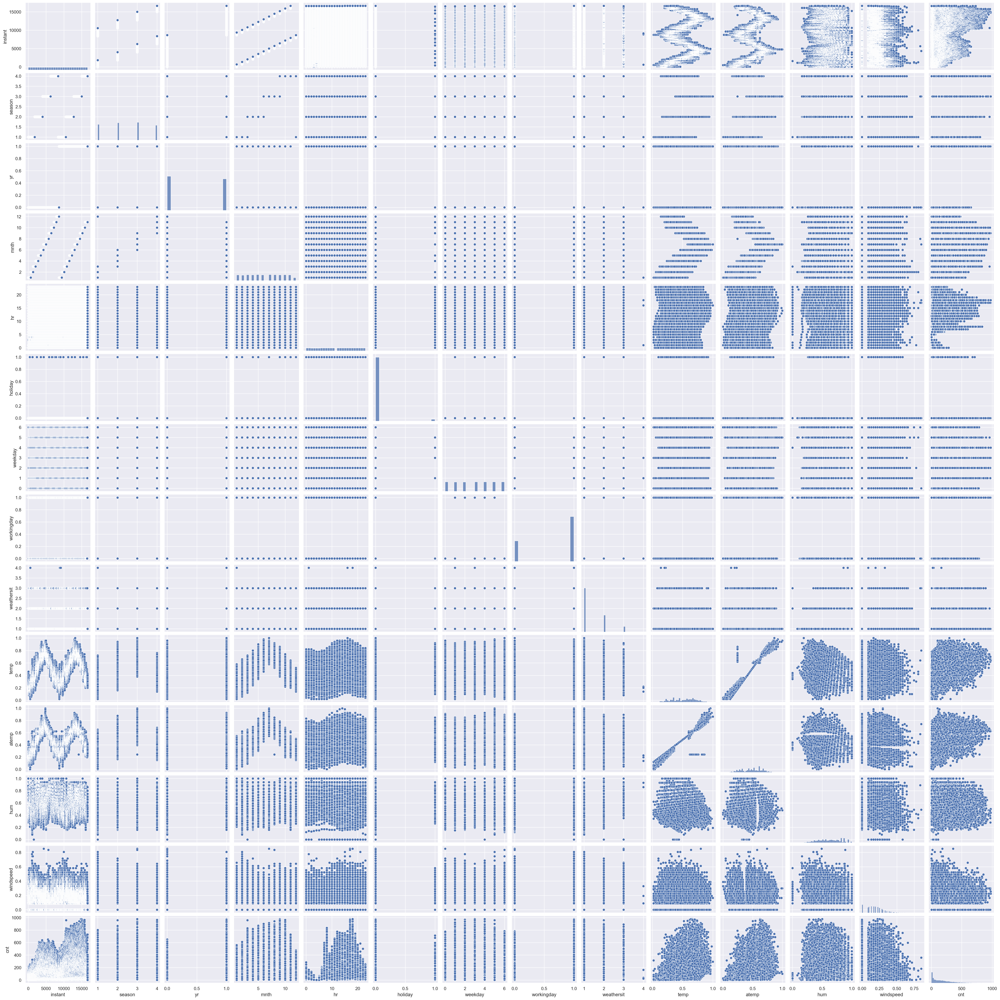

In [11]:
sns.pairplot(bikes)
plt.show()

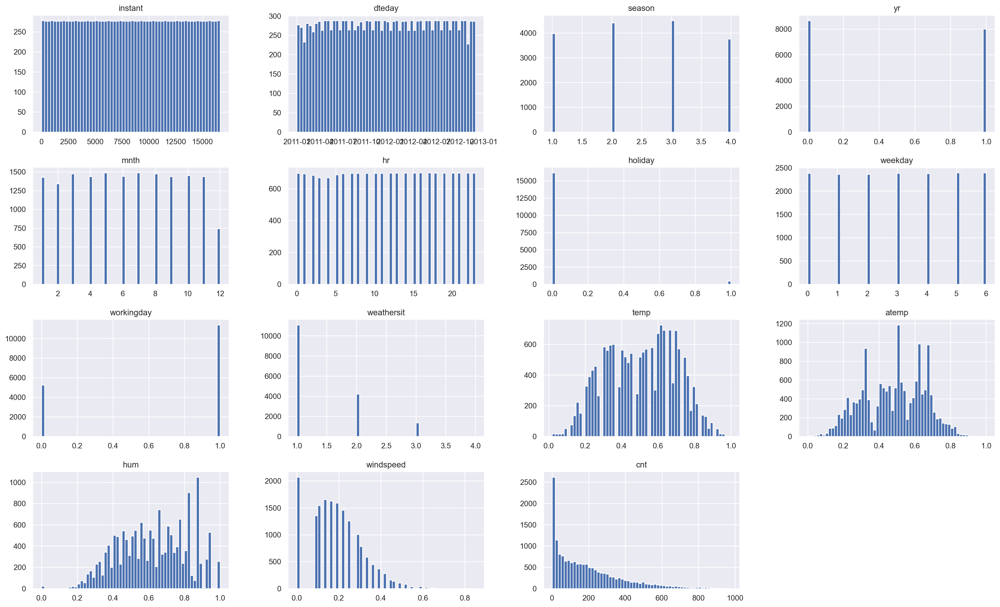

In [12]:
bikes.hist(bins=60)
plt.show()

In [13]:
#figuring out the hours with the most number of rented bikes

bikes[["hr", "cnt"]].groupby("hr").sum().sort_values(by='cnt', ascending=False)

,cnt
hr,
17,325205
18,299446
8,249847
19,219563
16,218505
13,177255
12,176739
15,175372
14,168343


<AxesSubplot:xlabel='hr'>

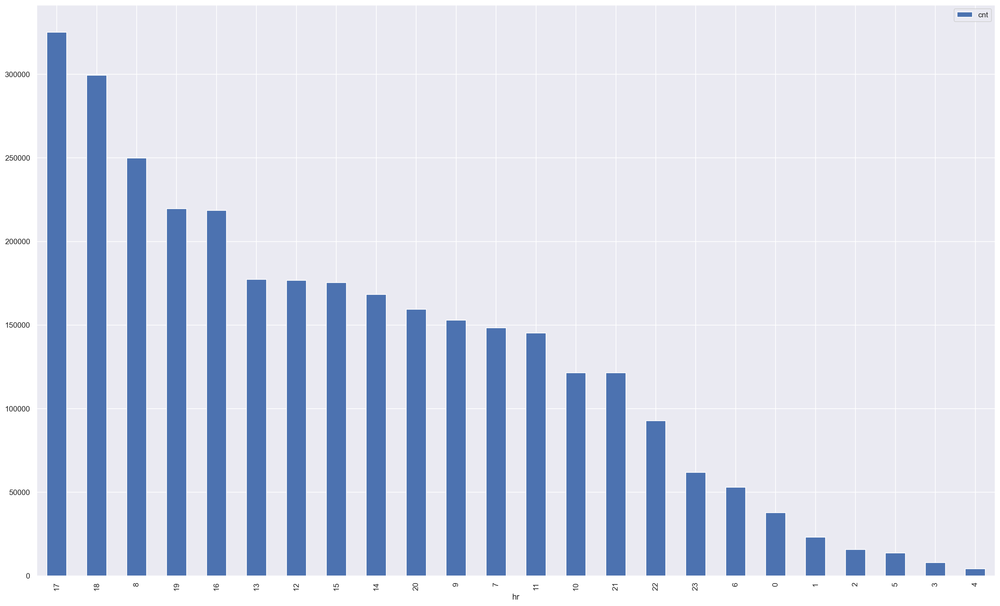

In [14]:
bikes[["hr", "cnt"]].groupby("hr").sum().sort_values(by='cnt', ascending=False).plot(kind='bar')

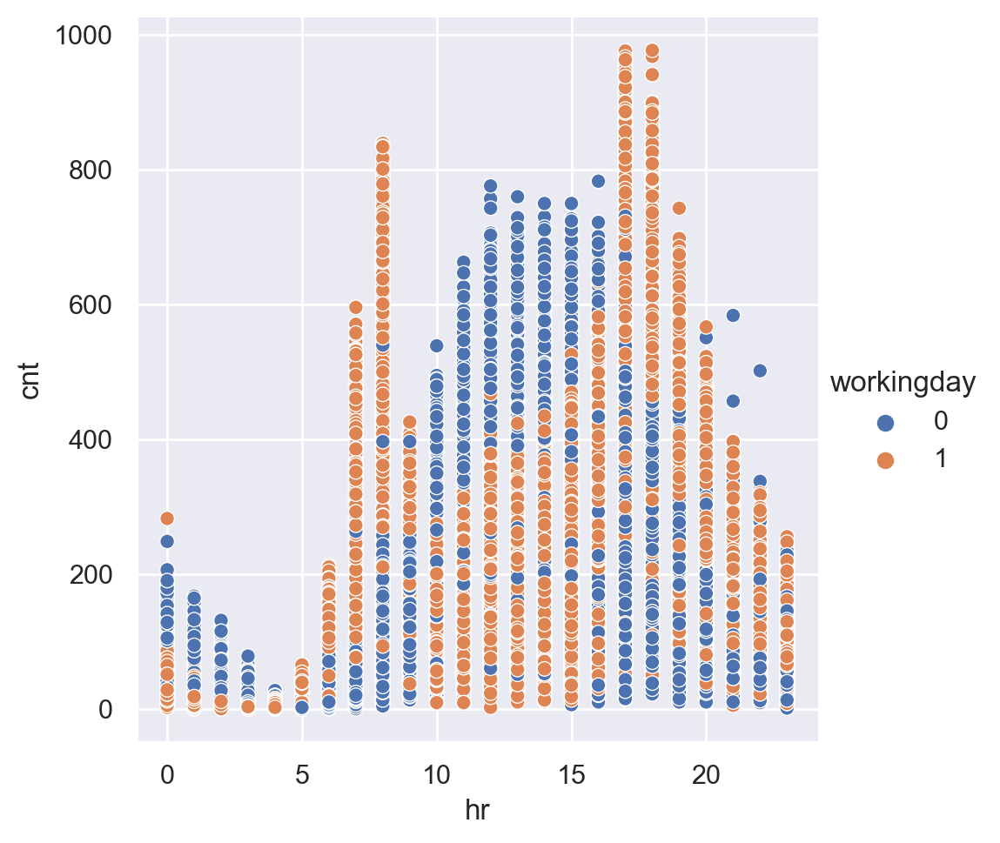

In [15]:
# making a plot to rappresent if there is a relationship between the famouse 8 hours job and the number of rented bikes

sns.relplot(x='hr', y='cnt', hue='workingday', data=bikes)

<AxesSubplot:xlabel='mnth', ylabel='cnt'>

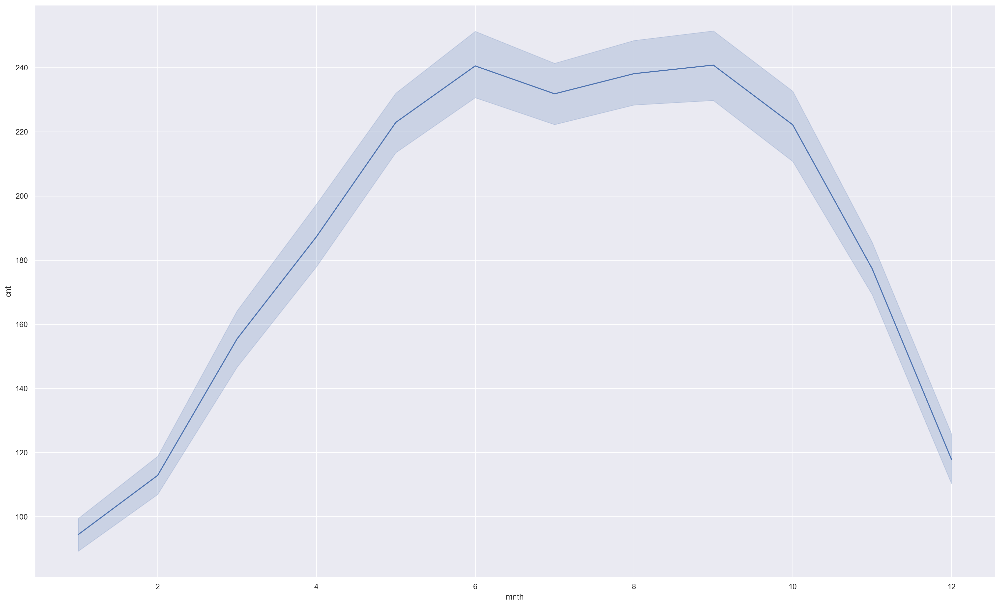

In [16]:
# making a plot to see the differences in the bikes' number through the months

sns.lineplot(y='cnt', x='mnth', data=bikes)

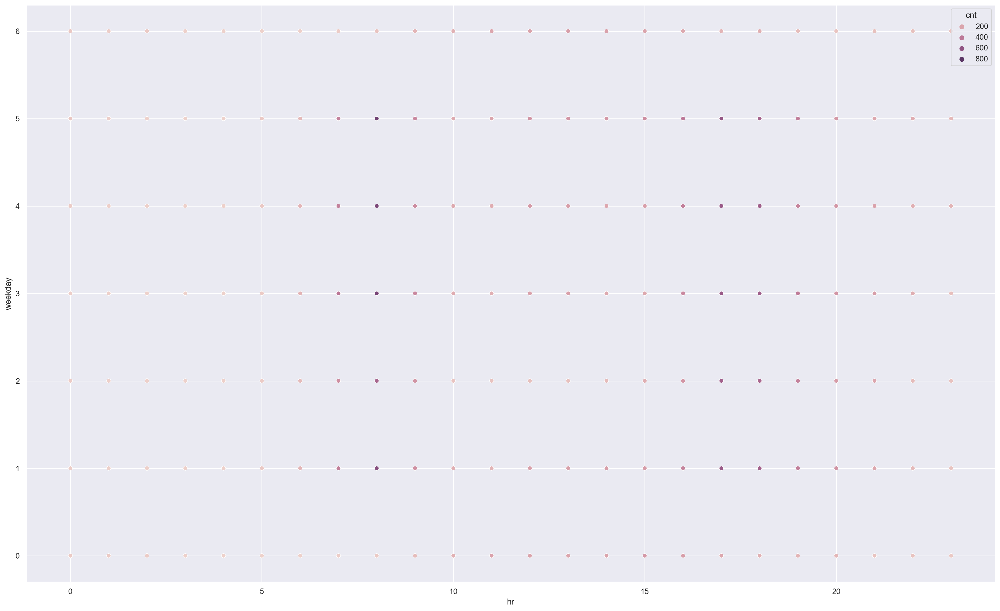

In [17]:
sns.scatterplot(x='hr',
                y='weekday',
                hue='cnt',
                data=bikes)
plt.show()

In [18]:
#finding out whtat's the day with the most rented bikes

bikes[bikes.cnt == bikes.cnt.max()]

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
14773,14774,2012-09-12,3,1,9,18,0,3,1,1,0.66,0.6212,0.44,0.2537,977


In [19]:
#finding out the days with the smallest number of rented bikes

bikes[bikes.cnt == bikes.cnt.min()]

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,1
5,6,2011-01-01,1,0,1,5,0,6,0,2,0.24,0.2576,0.75,0.0896,1
30,31,2011-01-02,1,0,1,7,0,0,0,2,0.40,0.4091,0.76,0.1940,1
49,50,2011-01-03,1,0,1,4,0,1,1,1,0.16,0.1364,0.47,0.3881,1
71,72,2011-01-04,1,0,1,2,0,2,1,1,0.14,0.1515,0.63,0.1343,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11733,11734,2012-05-09,2,1,5,2,0,3,1,3,0.56,0.5303,0.88,0.4478,1
15742,15743,2012-10-23,4,1,10,3,0,2,1,1,0.44,0.4394,0.77,0.1343,1
16232,16233,2012-11-14,4,1,11,2,0,3,1,1,0.24,0.2121,0.60,0.2985,1
16449,16450,2012-11-23,4,1,11,3,0,5,1,1,0.26,0.3030,0.70,0.0000,1


In [20]:
bikes[bikes.cnt > 900]

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
10622,10623,2012-03-23,2,1,3,17,0,5,1,2,0.72,0.6515,0.42,0.1642,957
13596,13597,2012-07-25,3,1,7,17,0,3,1,1,0.80,0.6970,0.31,0.0000,913
14293,14294,2012-08-23,3,1,8,18,0,4,1,1,0.74,0.6667,0.48,0.2239,941
14725,14726,2012-09-10,3,1,9,18,0,1,1,1,0.62,0.6212,0.35,0.2985,968
14748,14749,2012-09-11,3,1,9,17,0,2,1,1,0.70,0.6364,0.28,0.0000,970
14772,14773,2012-09-12,3,1,9,17,0,3,1,1,0.70,0.6364,0.41,0.2985,925
14773,14774,2012-09-12,3,1,9,18,0,3,1,1,0.66,0.6212,0.44,0.2537,977
14964,14965,2012-09-20,3,1,9,17,0,4,1,1,0.64,0.6212,0.50,0.2239,976
15084,15085,2012-09-25,4,1,9,17,0,2,1,1,0.66,0.6212,0.39,0.2836,967
15108,15109,2012-09-26,4,1,9,17,0,3,1,1,0.74,0.6667,0.48,0.2985,953


In [21]:
#checking the differences between the 9am and the 8 am in terms of rented bikes

bikes.groupby('hr').get_group(9).head(7)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
9,10,2011-01-01,1,0,1,9,0,6,0,1,0.32,0.3485,0.76,0.0000,14
32,33,2011-01-02,1,0,1,9,0,0,0,2,0.38,0.3939,0.76,0.2239,20
54,55,2011-01-03,1,0,1,9,0,1,1,1,0.16,0.1364,0.43,0.3881,88
77,78,2011-01-04,1,0,1,9,0,2,1,1,0.16,0.1515,0.64,0.2239,100
100,101,2011-01-05,1,0,1,9,0,3,1,1,0.22,0.1970,0.37,0.3284,115
123,124,2011-01-06,1,0,1,9,0,4,1,2,0.18,0.2424,0.51,0.0000,122
146,147,2011-01-07,1,0,1,9,0,5,1,1,0.20,0.1818,0.47,0.2985,134


In [22]:
bikes.groupby('hr').get_group(8).head(7)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
8,9,2011-01-01,1,0,1,8,0,6,0,1,0.24,0.2879,0.75,0.0000,8
31,32,2011-01-02,1,0,1,8,0,0,0,3,0.40,0.4091,0.71,0.2239,8
53,54,2011-01-03,1,0,1,8,0,1,1,1,0.14,0.1212,0.50,0.2836,154
76,77,2011-01-04,1,0,1,8,0,2,1,1,0.14,0.1515,0.69,0.1642,179
99,100,2011-01-05,1,0,1,8,0,3,1,1,0.20,0.1818,0.40,0.2985,195
122,123,2011-01-06,1,0,1,8,0,4,1,1,0.16,0.2273,0.59,0.0000,219
145,146,2011-01-07,1,0,1,8,0,5,1,1,0.20,0.1970,0.51,0.2537,210


In [23]:
#the same thing but between 5pm and 6 pm

bikes.groupby('hr').get_group(17).tail(7)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
16487,16488,2012-11-24,4,1,11,17,0,6,0,1,0.26,0.2273,0.41,0.3881,126
16511,16512,2012-11-25,4,1,11,17,0,0,0,1,0.28,0.2727,0.41,0.1642,181
16535,16536,2012-11-26,4,1,11,17,0,1,1,1,0.42,0.4242,0.32,0.0000,553
16559,16560,2012-11-27,4,1,11,17,0,2,1,2,0.30,0.2727,0.75,0.3881,527
16583,16584,2012-11-28,4,1,11,17,0,3,1,1,0.34,0.3333,0.31,0.1343,563
16606,16607,2012-11-29,4,1,11,17,0,4,1,1,0.34,0.3333,0.39,0.1940,561
16630,16631,2012-11-30,4,1,11,17,0,5,1,1,0.36,0.3485,0.50,0.1940,582


In [24]:
bikes.groupby('hr').get_group(18).tail(7)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
16488,16489,2012-11-24,4,1,11,18,0,6,0,1,0.26,0.2273,0.38,0.3881,145
16512,16513,2012-11-25,4,1,11,18,0,0,0,1,0.26,0.2576,0.44,0.1642,141
16536,16537,2012-11-26,4,1,11,18,0,1,1,1,0.36,0.3485,0.50,0.1642,521
16560,16561,2012-11-27,4,1,11,18,0,2,1,1,0.26,0.2273,0.81,0.3582,482
16584,16585,2012-11-28,4,1,11,18,0,3,1,1,0.32,0.3030,0.33,0.2836,542
16607,16608,2012-11-29,4,1,11,18,0,4,1,1,0.32,0.3182,0.49,0.1642,537
16631,16632,2012-11-30,4,1,11,18,0,5,1,2,0.34,0.3636,0.61,0.0000,509


In [25]:
# making an analysis of the months with the most number of rented bikes

bikes[["mnth", "cnt"]].groupby("mnth").sum().sort_values(by='cnt', ascending=False)

,cnt
mnth,
8,351194
6,346342
9,345991
7,344948
5,331686
10,322352
4,269094
11,254831
3,228920


<AxesSubplot:xlabel='mnth'>

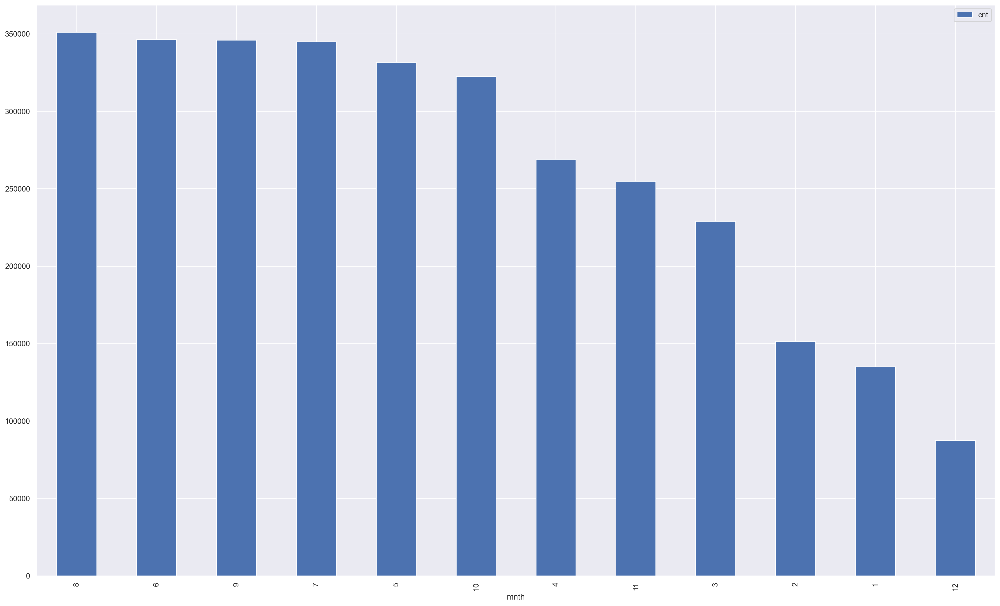

In [26]:
bikes[["mnth", "cnt"]].groupby("mnth").sum().sort_values(by='cnt', ascending=False).plot(kind='bar')

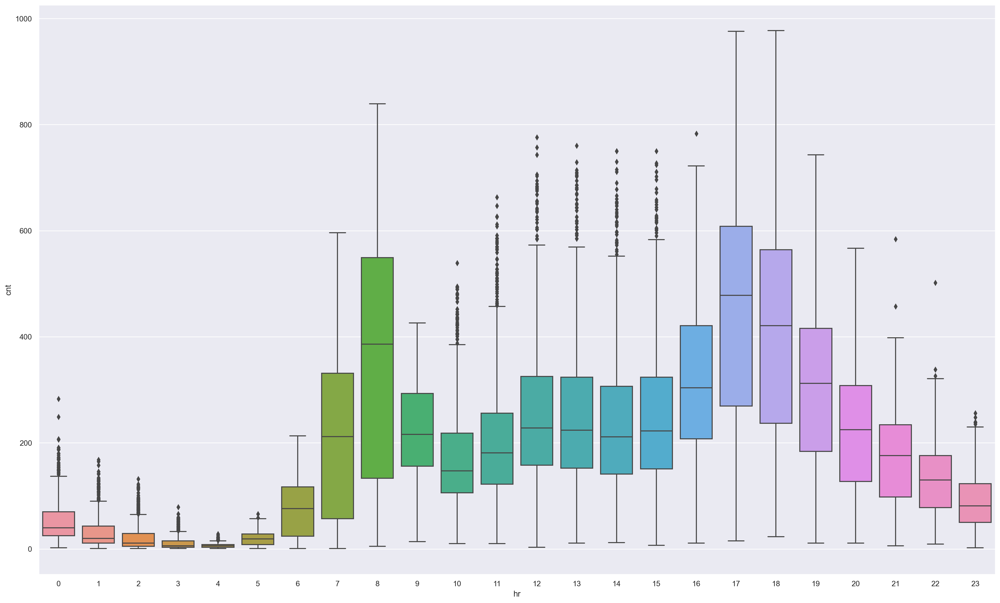

In [27]:
# creating a boxplot to analyse teh distribution of the values at specific hours

sns.boxplot(data=bikes, x='hr', y='cnt')
plt.show()

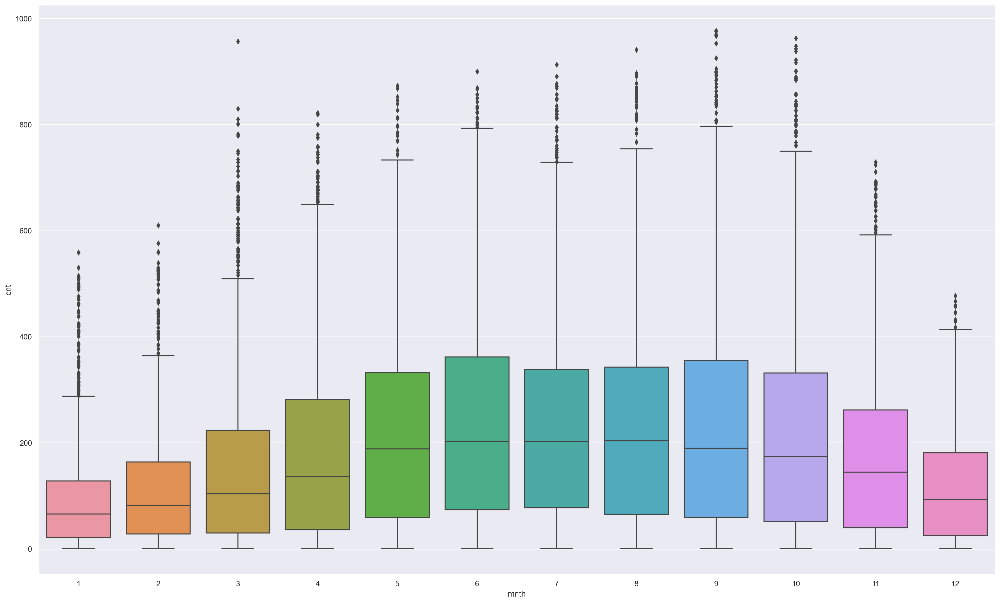

In [28]:
#the same but with the months

sns.boxplot(data=bikes, x='mnth', y='cnt')
plt.show()

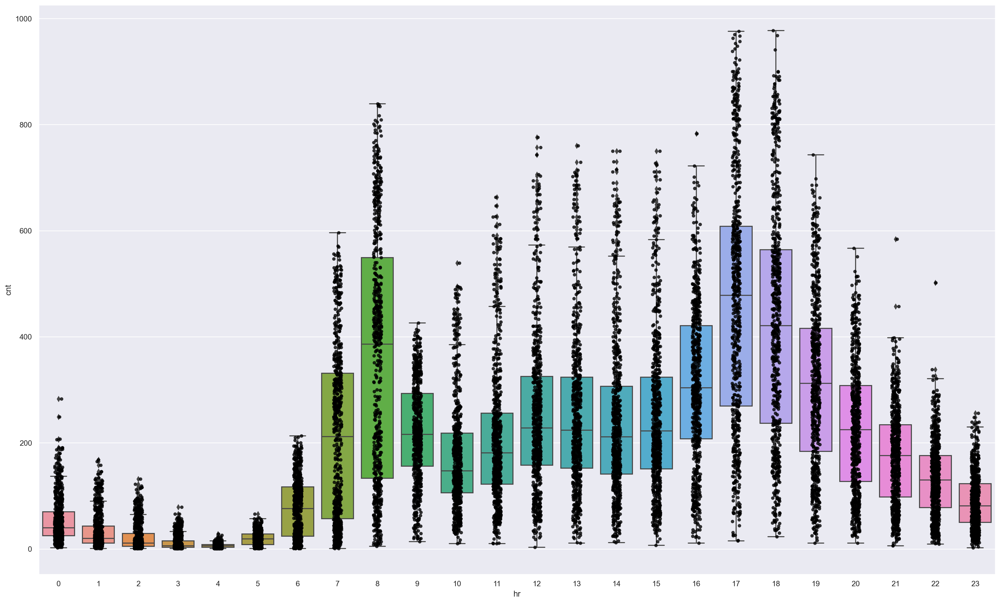

In [29]:
#a clear and complete distrubution of the data during the hours

sns.boxplot(data=bikes, x='hr', y='cnt')
sns.stripplot(data=bikes, x='hr', y='cnt',
             jitter=True,
             marker='o',
             alpha=0.8,
             color='black')
plt.show()

# The Modeling

In [30]:
# preparing the ColumnTransformer that we will pass to the pipeline

processor = ColumnTransformer(transformers=[
                         ('scaler', MinMaxScaler(), [ 2, 4, 5, 9]),
                         ('dropper','drop', [0, 1, 3, 6, 7, 10, 12])],
                          remainder='passthrough')

In [31]:
# dividing the dataset and making the split through the classic TrainTestSplit method

X = bikes.drop(['cnt'], axis=1)
y = bikes['cnt']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False, random_state=0)

In [32]:
# we will already apply the ColumnTransformer to the X_train and the X_test

X_train = processor.fit_transform(X_train)
X_test = processor.transform(X_test)

In [33]:
# and let's check out their shape

X_train.shape

(11645, 7)

In [34]:
X_test.shape

(4992, 7)

In [35]:
y_test.shape

(4992,)

In [36]:
# we will try the chosen model, the Random Forest Regressor

forest = RandomForestRegressor(n_estimators=100, random_state=False)

forest.fit(X_train, y_train)
y_pred = forest.predict(X_test)
y_train_pred = forest.predict(X_train)

In [37]:
# checking the scores for the first time

print(mean_absolute_percentage_error(y_test, y_pred))
print(mean_absolute_percentage_error(y_train, y_train_pred))

0.3708121073506758
0.1756900453768654


In [38]:
print(mean_absolute_error(y_test, y_pred))
print(mean_absolute_error(y_train, y_train_pred))

96.94231034337479
13.561863860434684


In [39]:
print(r2_score(y_test, y_pred))
print(r2_score(y_train, y_train_pred))

0.6359035036514022
0.9761788033278594


In [41]:
# Making a Cross_validation in order to estimate in a better way the robustness of a predictive model by repeating the splitting procedure
# This time as the cv we will use the Time Series Split

cv = TimeSeriesSplit(n_splits=10)
cv_results = cross_validate(
    forest, X_train, y_train, cv=cv, scoring=mape_score)

In [42]:
cv_results = pd.DataFrame(cv_results)
cv_results.head()

,fit_time,score_time,test_score
0,0.685632,0.047444,-0.459227
1,1.243425,0.051898,-0.511196
2,1.763908,0.046877,-0.289590
3,2.298041,0.062878,-0.252358
4,2.852501,0.046891,-0.549126


In [43]:
cv_results["test_error"] = -cv_results["test_score"]
cv_results.head()

,fit_time,score_time,test_score,test_error
0,0.685632,0.047444,-0.459227,0.459227
1,1.243425,0.051898,-0.511196,0.511196
2,1.763908,0.046877,-0.289590,0.289590
3,2.298041,0.062878,-0.252358,0.252358
4,2.852501,0.046891,-0.549126,0.549126


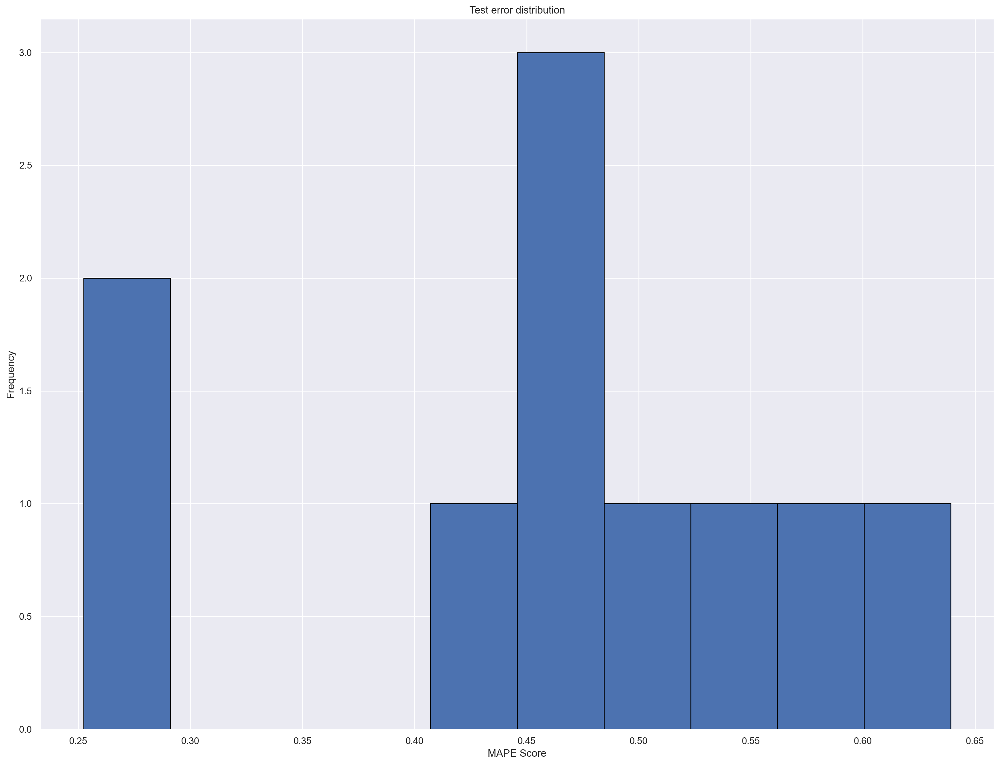

In [44]:
# we will make a plotin order to see the distribution of the test error through all the splits 

plt.figure(figsize=(20,15))
cv_results["test_error"].plot.hist(bins=10, edgecolor="black")
plt.xlabel("MAPE Score")
_ = plt.title("Test error distribution")

In [45]:
# we will now create the GridSearch for our model in order to figure out the parameters to pass in

cv = TimeSeriesSplit(n_splits=10)

params = {
    'max_depth': [5, 6, 7, 8],
    'n_estimators':[50, 60, 70, 80]
}

gsearch = GridSearchCV(estimator=forest, cv=cv, param_grid=params, scoring = mape_score)

gsearch.fit(X_train, y_train)
print(gsearch.best_params_)
print(gsearch.best_score_)

{'max_depth': 8, 'n_estimators': 60}
-0.47381180481647506


In [46]:
# we will repeat the process trying to improve our parameters

# we will now create the GridSearch for our model in order to figure out the parameters to pass in

cv = TimeSeriesSplit(n_splits=10)

params2 = {
    'max_depth': [8, 9, 10, 11],
    'n_estimators':[60]
}

gsearch2 = GridSearchCV(estimator=forest, cv=cv, param_grid=params2, scoring = mape_score)

gsearch2.fit(X_train, y_train)
print(gsearch2.best_params_)
print(gsearch2.best_score_)

{'max_depth': 11, 'n_estimators': 60}
-0.4611053476690157


In [47]:
preds = gsearch2.predict(X_test)
train_preds = gsearch2.predict(X_train)

In [48]:
# we will check the scores to analysis the differences between the two batches of scores

print(mean_absolute_percentage_error(y_test, preds))
print(mean_absolute_percentage_error(y_train, train_preds))

0.36517688309665103
0.329072614533099


In [49]:
print(mean_absolute_error(y_test, preds))
print(mean_absolute_error(y_train, train_preds))

97.10338884568344
28.781075890251767


In [50]:
print(r2_score(y_test, preds))
print(r2_score(y_train, train_preds))

0.6344613598784996
0.9001226671583419


<module 'matplotlib.pyplot' from 'C:\\Users\\alexp\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

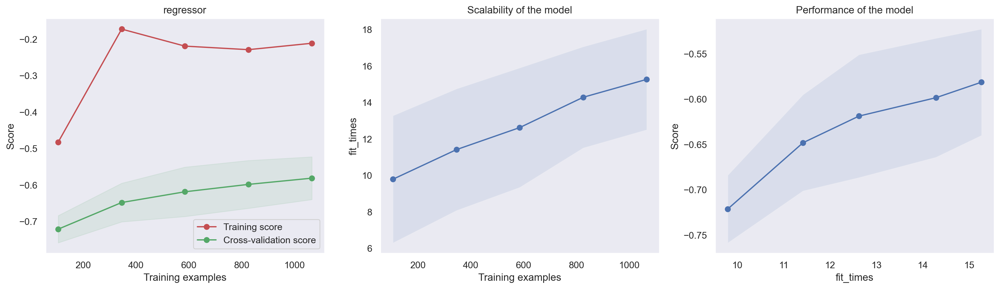

In [51]:
# we will plot the learning curve to visualize the MAPE of our model, a model that clearly overfit

plot_learning_curve(gsearch2,'regressor', X_train, y_train, cv=TimeSeriesSplit(n_splits=10), n_jobs=-1, scoring=mape_score)

In [52]:
# we will create now our pipeline using the ColumnTransformer and our Model, the RandomForestRegressor

import joblib

pipemodel = Pipeline(steps=[
                            ('preprocessing', processor),
                            ('model', RandomForestRegressor(max_depth=11, n_estimators=60, random_state=False))
])

pipemodel.fit(bikes.iloc[:,:-1], bikes.iloc[:,-1])    

joblib.dump(pipemodel, 'Alex_Palea_pipeline.joblib')

['Alex_Palea_pipeline.joblib']

In [53]:
# we will load back our pipeline

pipeline = joblib.load('Alex_Palea_pipeline.joblib')

In [54]:
# now we will import the test set and we will use the pipeline to predict the number of bikes

test = pd.read_csv('test.csv', parse_dates=['dteday'])
test_preds = pipemodel.predict(test)
test.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed
0,16638,2012-12-01,4,1,12,0,0,6,0,1,0.26,0.3030,0.81,0.0000
1,16639,2012-12-01,4,1,12,1,0,6,0,1,0.26,0.3030,0.81,0.0000
2,16640,2012-12-01,4,1,12,2,0,6,0,2,0.26,0.3030,0.81,0.0000
3,16641,2012-12-01,4,1,12,3,0,6,0,2,0.26,0.2727,0.81,0.1343
4,16642,2012-12-01,4,1,12,4,0,6,0,1,0.26,0.2879,0.81,0.0896


In [55]:
# we will merge our predictions in a new dataset that will be transformed in a csv file

predictions = test.loc[:, ['dteday','hr']]
predictions.columns = ['date', 'hour']
predictions['count'] = np.round(test_preds,0)
predictions.head()

,date,hour,count
0,2012-12-01,0,84.0
1,2012-12-01,1,80.0
2,2012-12-01,2,52.0
3,2012-12-01,3,12.0
4,2012-12-01,4,8.0


In [56]:
predictions.to_csv('Alex_Palea_Predictions.csv', index=False)